<a href="https://colab.research.google.com/github/macaluzate/Tarea3-Canavera-Martin/blob/main/Tarea3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **😀PORTADA😀**


<center>
  

## **📉📈➕✖️➖➗🟰📚📙✏️🖋️✒️📝📉📈➕✖️➖➗🟰📚📙✏️🖋️✒️📝📉📈➕✖️**

## **Solución de Ecuaciones Diferenciales Ordinarias**

## **Asignatura**

  Análisis Numérico

## **Profesora**
  Manuela Bastidas Olivares

## **Estudiantes**

 Mateo Cañavera Aluma

 David Esteban Martin Acosta


## **Universidad Nacional de Colombia**
## **Sede Medellín**
## **2024 - 2**

## **📉📈➕✖️➖➗🟰📚📙✏️🖋️✒️📝📉📈➕✖️➖➗🟰📚📙✏️🖋️✒️📝📉📈➕✖️**

# **👩‍💻IMPLEMENTACIONES👨‍💻**

<center>

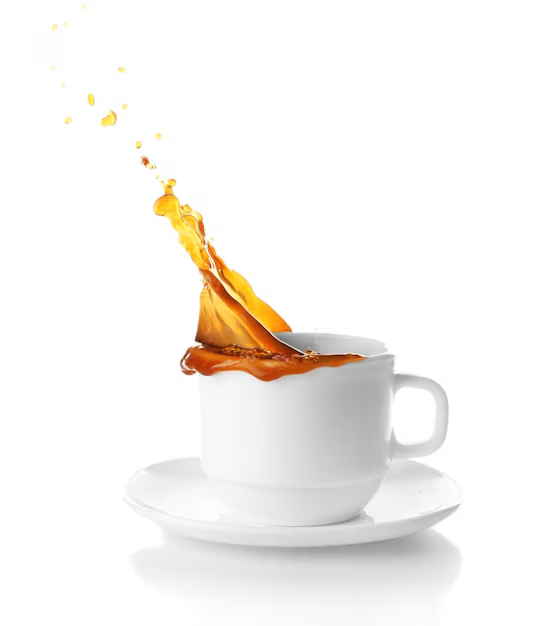


</center>

###**Solución numérica del sistema de ecuaciones diferenciales ordinarias de primer orden con el módulo de Python solve\_ivp**

**Implementación 1**

**📥Importaciones📦**

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import random
import ipywidgets

**Planteamiento sistema de ecuaciones diferenciales**

In [ ]:
def sloshing_system(t, y, epsilon, lambda_, Omega):
    u, v = y
    u_prime = v
    v_prime = - (1 + epsilon * lambda_ * Omega**2 * np.cos(Omega * t)) * (u - (epsilon**2 * u**3) / 6)
    return [u_prime, v_prime]

**Conjuntos de parámetros**

In [ ]:
params_set_1 = {"epsilon": 0.2,"lambda_": 0.1,"Omega": 2.0}

params_set_2 = {"epsilon": 0.5,"lambda_": 0.2,"Omega": 1.5}

**Condiciones iniciales**

In [ ]:
y0 = [0.1, 0.0]  # u(0) = 0.1, v(0) = 0.0
t_span = (0, 50)  # Intervalo de tiempo
t_eval = np.linspace(*t_span, 1000)  # Puntos donde evaluar la solución

**Solución del sistema con el primer conjunto de parámetros**

In [ ]:

solution_1 = solve_ivp(sloshing_system, t_span, y0, t_eval=t_eval, args=(params_set_1["epsilon"], params_set_1["lambda_"], params_set_1["Omega"]))

**Solución del sistema con el segundo conjunto de parámetros**

In [ ]:

solution_2 = solve_ivp(sloshing_system, t_span, y0, t_eval=t_eval, args=(params_set_2["epsilon"], params_set_2["lambda_"], params_set_2["Omega"]))

**Visualización**

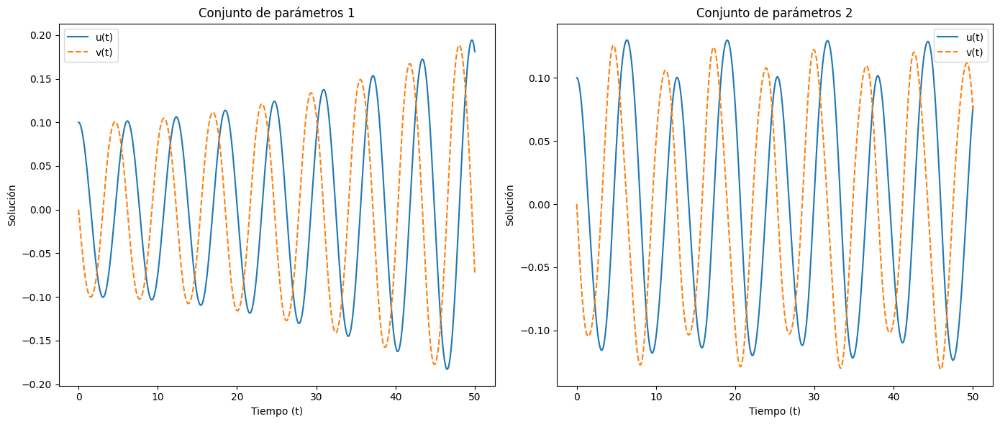

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(solution_1.t, solution_1.y[0], label='u(t)')
plt.plot(solution_1.t, solution_1.y[1], label="v(t)", linestyle='--')
plt.title('Conjunto de parámetros 1')
plt.xlabel('Tiempo (t)')
plt.ylabel('Solución')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(solution_2.t, solution_2.y[0], label='u(t)')
plt.plot(solution_2.t, solution_2.y[1], label="v(t)", linestyle='--')
plt.title('Conjunto de parámetros 2')
plt.xlabel('Tiempo (t)')
plt.ylabel('Solución')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
def plot_and_analyze_results(solution, params, title):
    u = solution.y[0]  # Desplazamiento u(t)
    v = solution.y[1]  # Velocidad v(t)
    time = solution.t   # Tiempo

    epsilon = params["epsilon"]
    lambda_ = params["lambda_"]
    Omega = params["Omega"]

    plt.figure(figsize=(12, 5))
    plt.plot(time, u, label='u(t) (Desplazamiento)', color='blue')
    plt.plot(time, v, label='v(t) (Velocidad)', color='orange', linestyle='--')
    plt.title(f'{title}\nParámetros: ε={epsilon}, λ={lambda_}, Ω={Omega}')
    plt.xlabel('Tiempo (t)')
    plt.ylabel('Valor')
    plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

    # Análisis básico
    max_u = np.max(np.abs(u))
    max_v = np.max(np.abs(v))

    print(f"Análisis de resultados para {title}:")
    print(f"- Máximo desplazamiento absoluto (|u(t)|): {max_u:.4f}")
    print(f"- Máxima velocidad absoluta (|v(t)|): {max_v:.4f}")
    print(f"- Los valores de ε, λ y Ω influyen en la amplitud y frecuencia de las oscilaciones.\n")

**Resultados primer conjunto de parámetros**

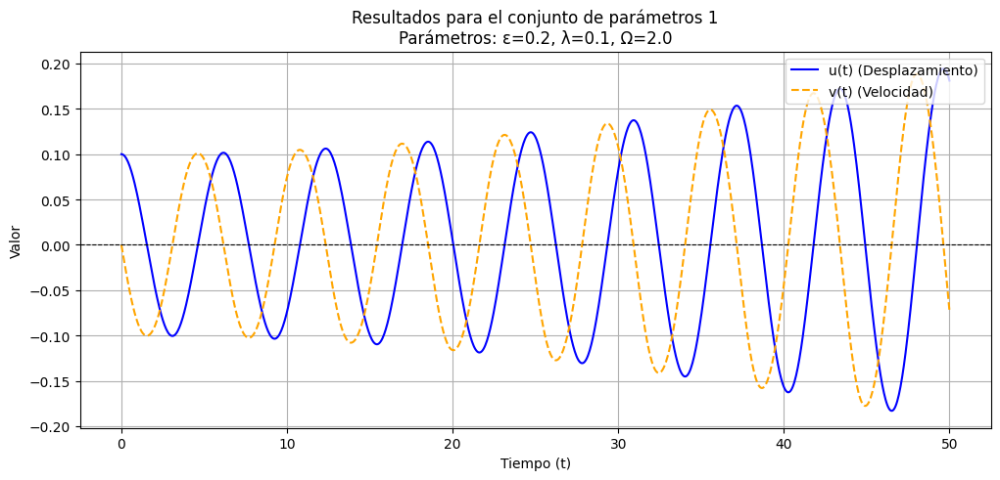

Análisis de resultados para Resultados para el conjunto de parámetros 1:
- Máximo desplazamiento absoluto (|u(t)|): 0.1943
- Máxima velocidad absoluta (|v(t)|): 0.1884
- Los valores de ε, λ y Ω influyen en la amplitud y frecuencia de las oscilaciones.



In [ ]:

plot_and_analyze_results(solution_1, params_set_1, "Resultados para el conjunto de parámetros 1")

**Resultados primer conjunto de parámetros**

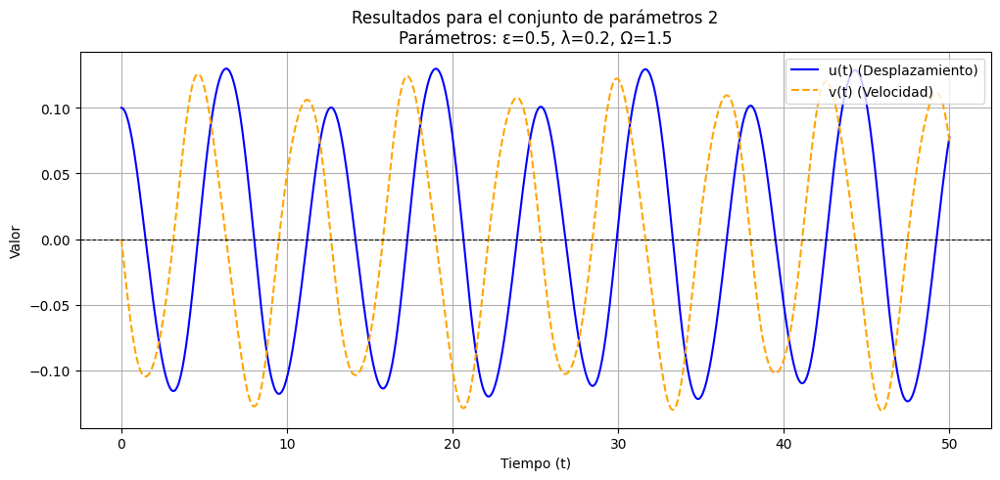

Análisis de resultados para Resultados para el conjunto de parámetros 2:
- Máximo desplazamiento absoluto (|u(t)|): 0.1298
- Máxima velocidad absoluta (|v(t)|): 0.1307
- Los valores de ε, λ y Ω influyen en la amplitud y frecuencia de las oscilaciones.



In [ ]:
plot_and_analyze_results(solution_2, params_set_2, "Resultados para el conjunto de parámetros 2")

<center>

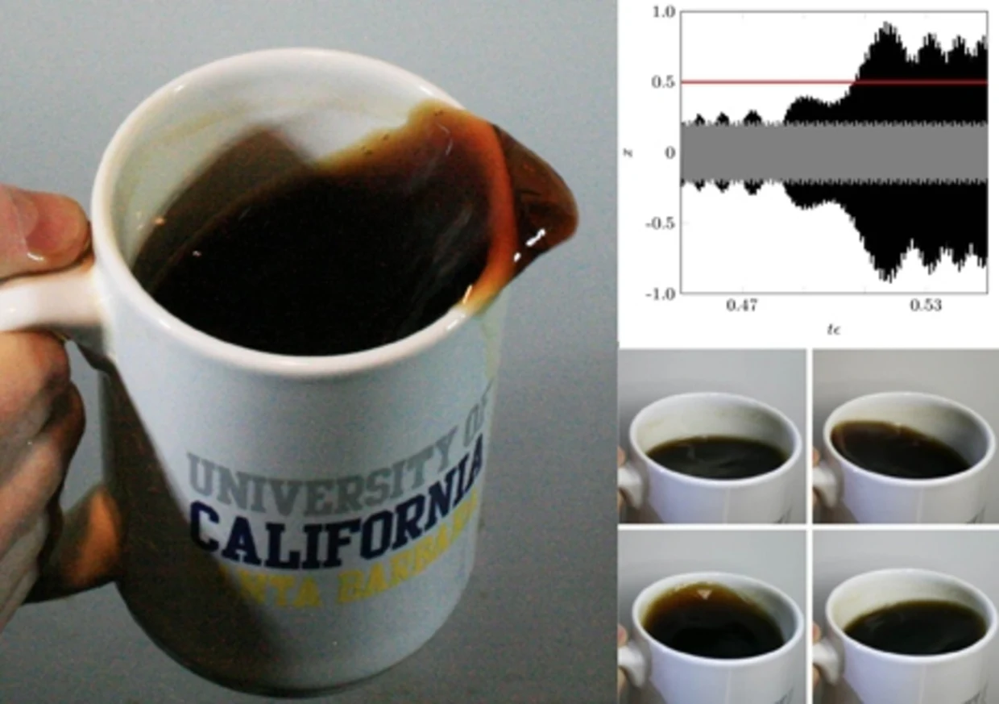


</center>

**Implementación 2**

**Planteamiento sistema de ecuaciones diferenciales**

In [ ]:

oscilacion_vertical = lambda tiempo, estado, frecuencia, coef_lambda, perturba: np.array([estado[1], - (1 + perturba * coef_lambda * frecuencia**2 * np.cos(frecuencia * tiempo)) * (estado[0] - perturba**2 * estado[0]**3 / 6)])

**Parámetros**

In [ ]:

frecuencia = [2, 1]
coef_lambda = [0.1, 0.2]
perturba = [0.2, 0.5]
posicion_0 = [0.5, 0.5]
velocidad_0 = [0.5, 0.5]
tiempo_inicio = [0, 0]
tiempo_fin = [10, 10]

**Visualización de los datos para la evaluación del sistema**

In [ ]:

salida = lambda tiempo, posicion, velocidad, muestras=5: (
print("\033[94m" + "╔═════════════════════════════════════════════════╗\n"
          "║         SOLUCIÓN NUMÉRICA DEL SISTEMA           ║\n"
          "╚═════════════════════════════════════════════════╝\033[0m"),
    print(f"{'Índice':<7} {'Tiempo':<12} {'Posición':<12} {'Velocidad':<12}"),
    print("─" * 45),
    [print(f"{i:<7} {tiempo[i]:<12.4f} {posicion[i]:<12.4f} {velocidad[i]:<12.4f}")
     for i in sorted(random.sample(range(len(tiempo)), muestras))],
    print("─" * 45 + "\n"))


**Solución del sistema**

In [ ]:

solucion = lambda posicion_0, velocidad_0, tiempo_inicio, tiempo_fin, frecuencia, coef_lambda, perturba, mostrar_muestra=False: ((solucion := scipy.integrate.solve_ivp(oscilacion_vertical, (tiempo_inicio, tiempo_fin), [posicion_0, velocidad_0], args=(frecuencia, coef_lambda, perturba))),(mostrar_muestra and salida(solucion.t, solucion.y[0], solucion.y[1])),(solucion.t, solucion.y[0], solucion.y[1]))[-1]

**Salida con los diferentes conjuntos de parámetros**

In [ ]:
tiempo, posicion, velocidad = solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], tiempo_fin[0], frecuencia[0], coef_lambda[0], perturba[0], mostrar_muestra=True)


╔═════════════════════════════════════════════════╗
║         SOLUCIÓN NUMÉRICA DEL SISTEMA           ║
╚═════════════════════════════════════════════════╝
Índice  Tiempo       Posición     Velocidad   
─────────────────────────────────────────────
1       0.0986       0.5466       0.4444      
2       1.0104       0.6747       -0.1717     
7       5.8871       0.2312       0.5875      
9       7.8211       0.4441       -0.4109     
11      9.6900       -0.5046      -0.2861     
─────────────────────────────────────────────



In [ ]:
tiempo, posicion, velocidad = solucion( posicion_0[1], velocidad_0[1],  tiempo_inicio[1],  tiempo_fin[1],  frecuencia[1],  coef_lambda[1],  perturba[1],  mostrar_muestra=True)


╔═════════════════════════════════════════════════╗
║         SOLUCIÓN NUMÉRICA DEL SISTEMA           ║
╚═════════════════════════════════════════════════╝
Índice  Tiempo       Posición     Velocidad   
─────────────────────────────────────────────
2       1.0212       0.6660       -0.1994     
3       1.9732       0.2211       -0.6580     
5       3.9265       -0.7309      -0.0204     
9       7.8778       0.4817       -0.5111     
11      9.8112       -0.6594      -0.3095     
─────────────────────────────────────────────



<center>

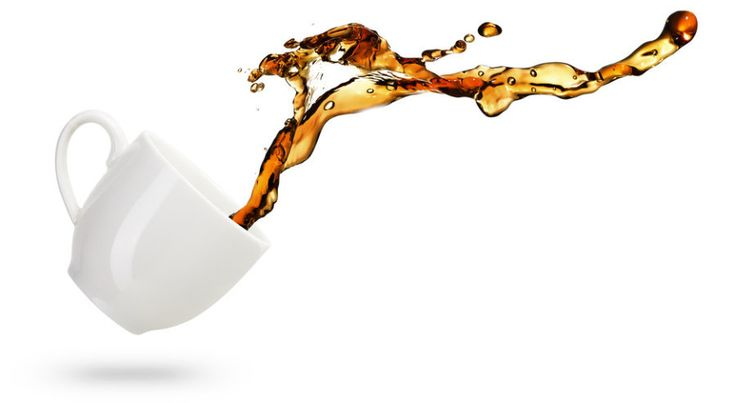



</cemter>

### **Presentar y analizar los resultados numéricos mediante gráficos bien etiquetados. Documente claramente los valores de los parámetros utilizados y discutir su impacto en el comportamiento de sloshing.**

<center>

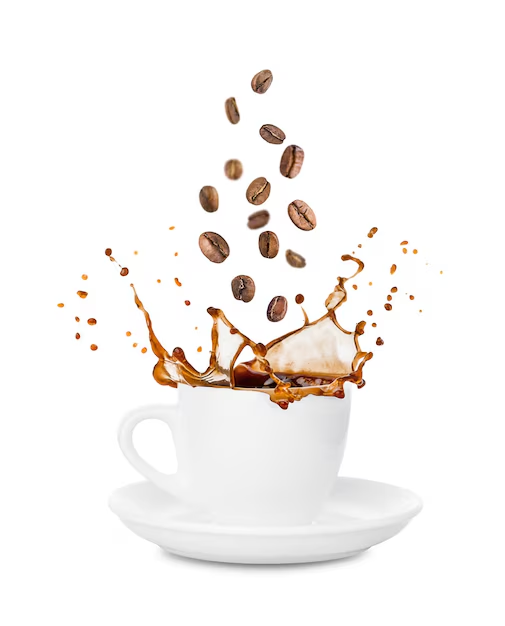


</center>

**Visualizaciòn**

In [ ]:

def Visualizar(tiempo, posicion, velocidad):
    plt.style.use("ggplot")
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].plot(tiempo, posicion, color="royalblue", linewidth=2, label="u(Tau) (solución scipy)")
    axes[0].set_xlabel("Tiempo", fontsize=12)
    axes[0].set_ylabel("Posición", fontsize=12)
    axes[0].set_title("Movimiento Vertical del Pivote", fontsize=14, fontweight="bold")
    axes[0].legend()
    axes[0].grid(True, linestyle="--", alpha=0.6)
    axes[1].plot(tiempo, velocidad, color="darkred", linewidth=2, label="u'(tiempo) (solución scipy)")
    axes[1].set_xlabel("Tau", fontsize=12)
    axes[1].set_ylabel("Velocidad", fontsize=12)
    axes[1].set_title("Velocidad del Movimiento Vertical", fontsize=14, fontweight="bold")
    axes[1].legend()
    axes[1].grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()

**Prueba para el primer conjunto de paràmetros**

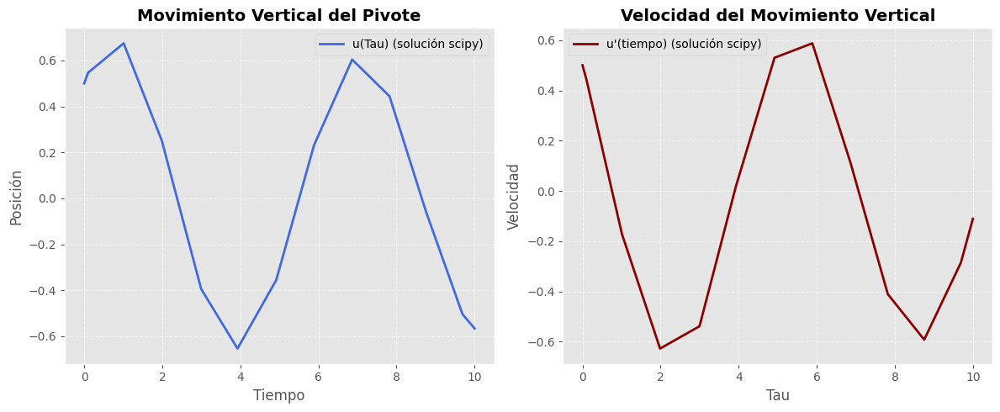

In [ ]:

Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], tiempo_fin[0], frecuencia[0], coef_lambda[0], perturba[0]))

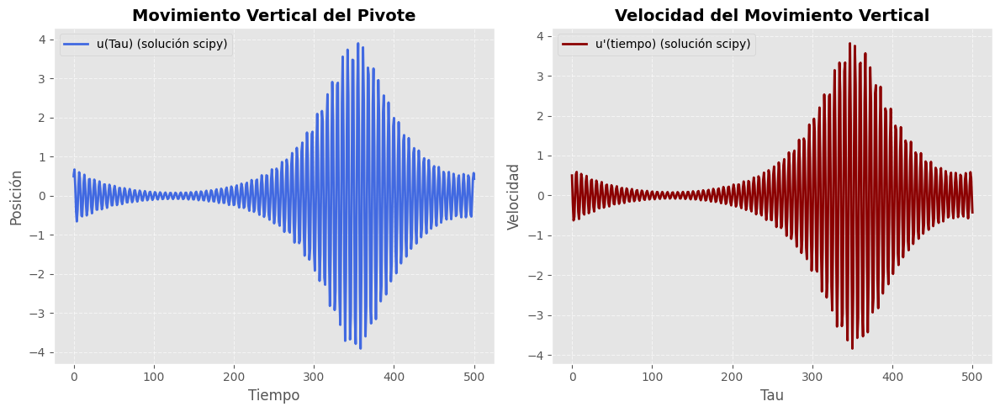

In [ ]:

Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 500, frecuencia[0], coef_lambda[0], perturba[0]))

**Prueba para el segundo conjunto de paràmetros**

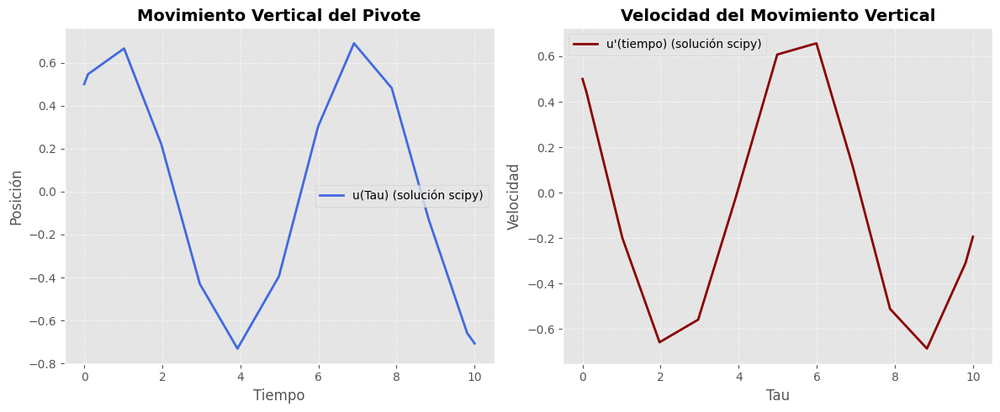

In [ ]:

Visualizar(*solucion(posicion_0[1], velocidad_0[1], tiempo_inicio[1], tiempo_fin[1], frecuencia[1], coef_lambda[1], perturba[1]))

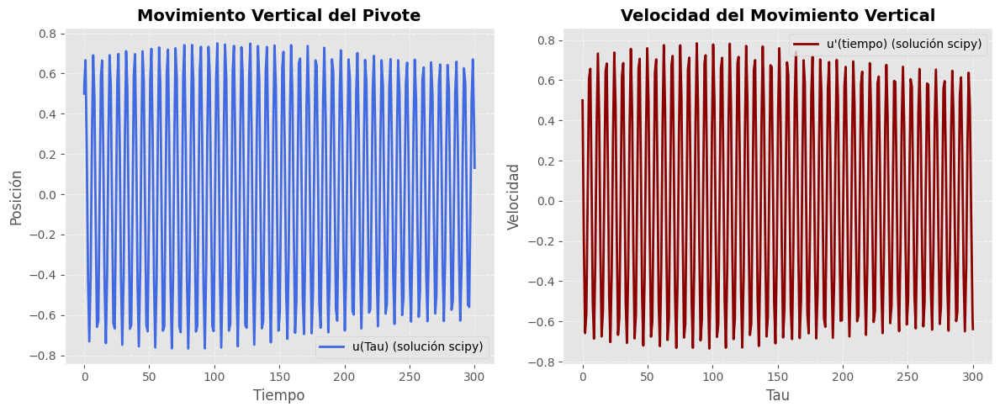

In [ ]:

Visualizar(*solucion(posicion_0[1], velocidad_0[1], tiempo_inicio[1], 300, frecuencia[1], coef_lambda[1], perturba[1]))  # Gráfica extra

### **🔂Modificaciòn de paràmetros y efectos en el contexto del problema🔄**

<center>

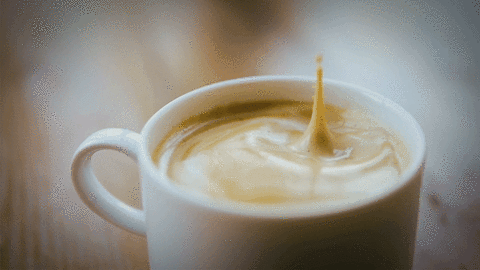



</center>

<div align="justify">

Vamos a realizar una experimentaciòn sobre la modifiacion de los siguiente paràmetros:

- Frecuencia adimensional relativa $Ω$
- Relación entre la longitud efectiva y la amplitud de oscilación $λ$
- Conteo $ϵ$



</div>

**Experimentacion frecuencia adimensional relativa**

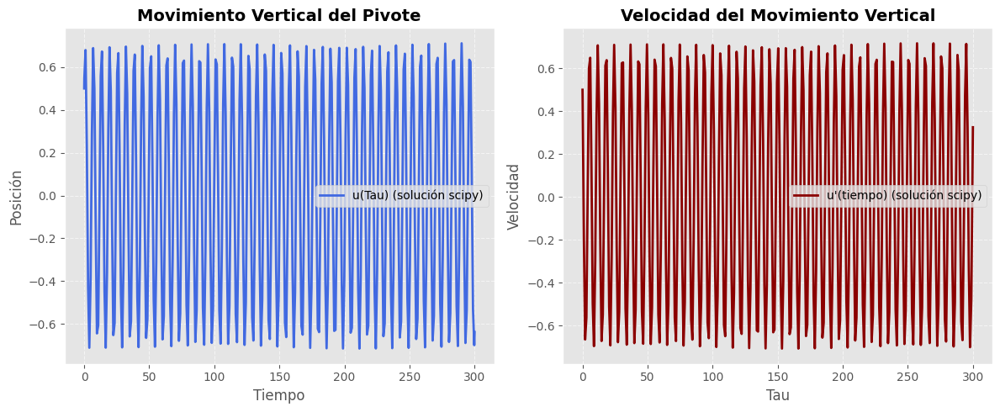

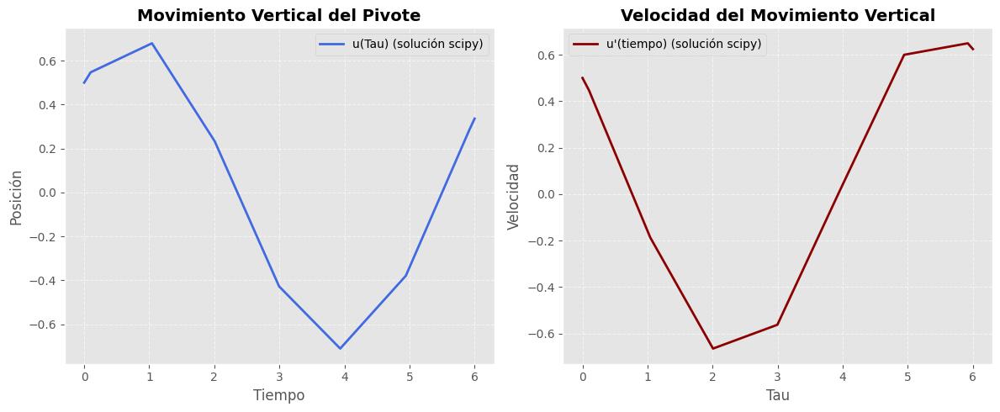

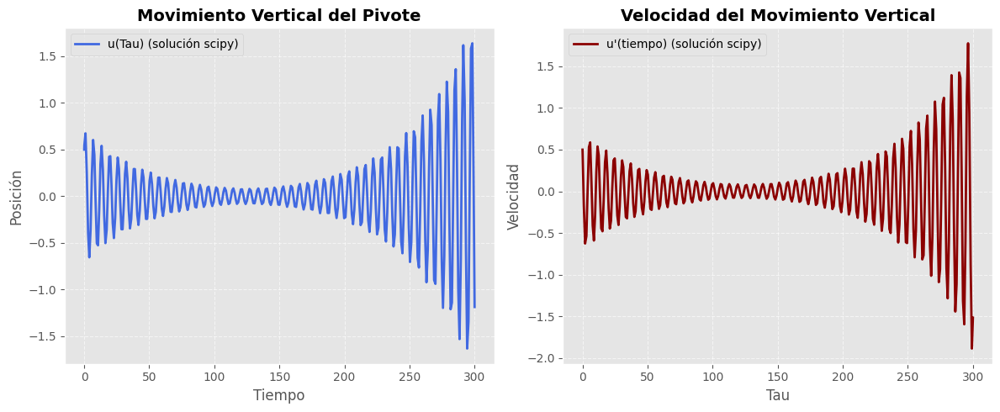

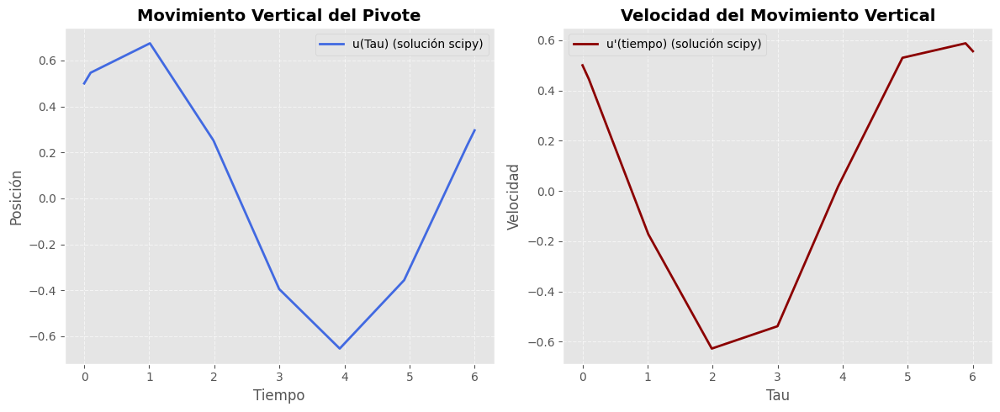

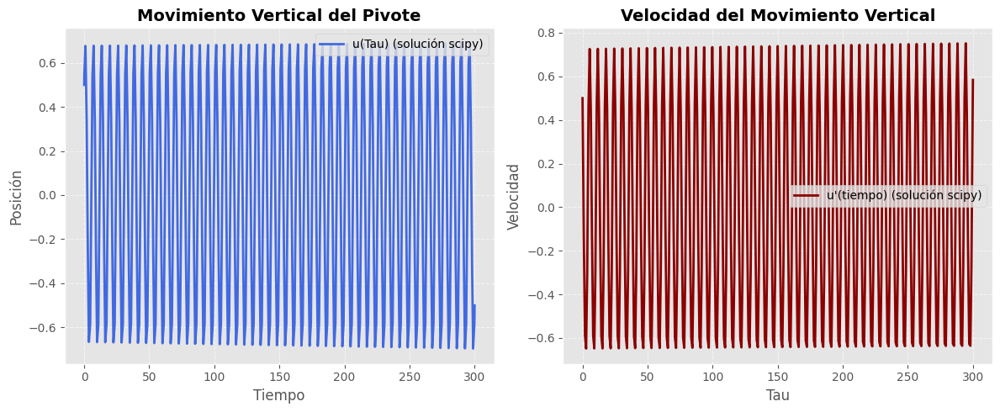

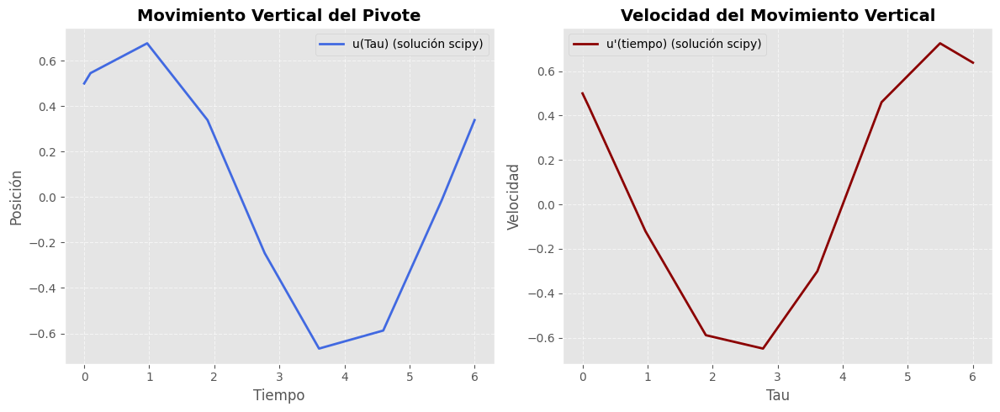

In [ ]:

for k in range(1,4):
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 300, k, coef_lambda[0], perturba[0]))
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 6, k, coef_lambda[0], perturba[0]))



**Observaciones**

<div align="justify">

El estudio de la dinámica de oscilación del café mientras se camina con una taza en la mano se basa en un modelo de péndulo no lineal con excitación paramétrica y directa. En este contexto, se ha demostrado que la frecuencia adimensional relativa $Ω$ juega un papel clave en la estabilidad y el comportamiento oscilatorio del líquido dentro de la taza

De acuerdo con los experimentos numéricos realizados, se ha observado que cuando $Ω$ = 2, la amplitud del comportamiento oscilatorio varía significativamente con el tiempo. Este fenómeno puede atribuirse a la aparición de resonancias paramétricas, un efecto bien documentado en la literatura sobre péndulos paramétricamente excitados
</div>

<center>

**Experimentación relación entre la longitud efectiva y la amplitud de oscilación**

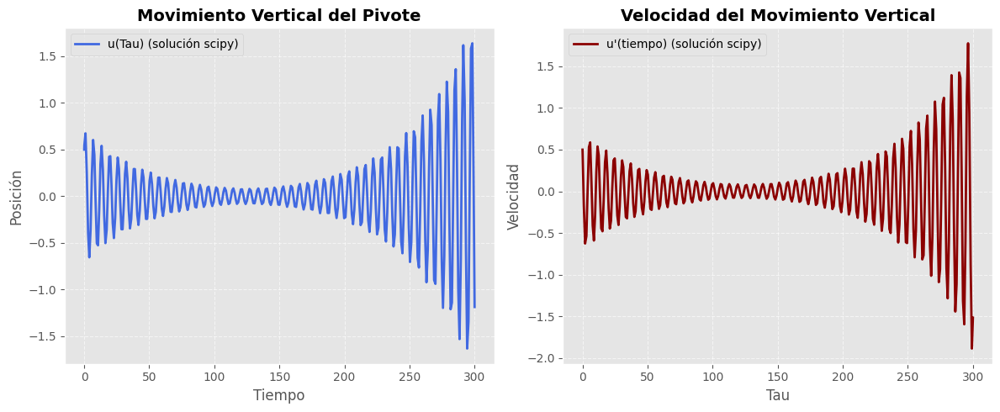

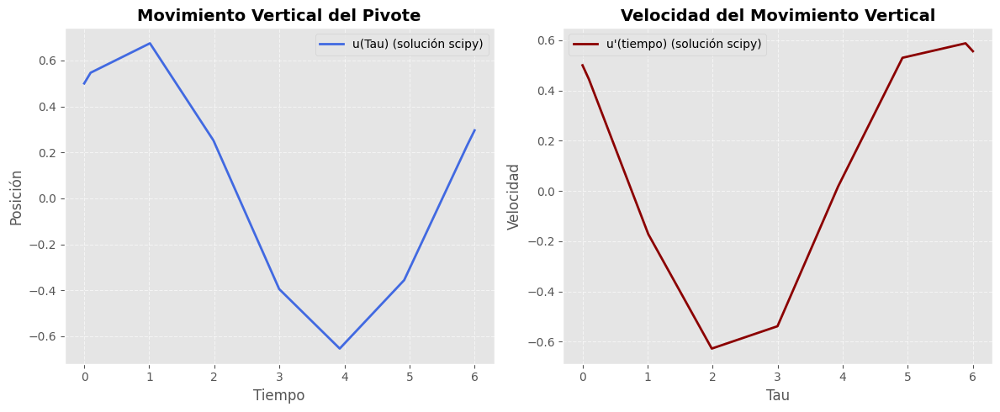

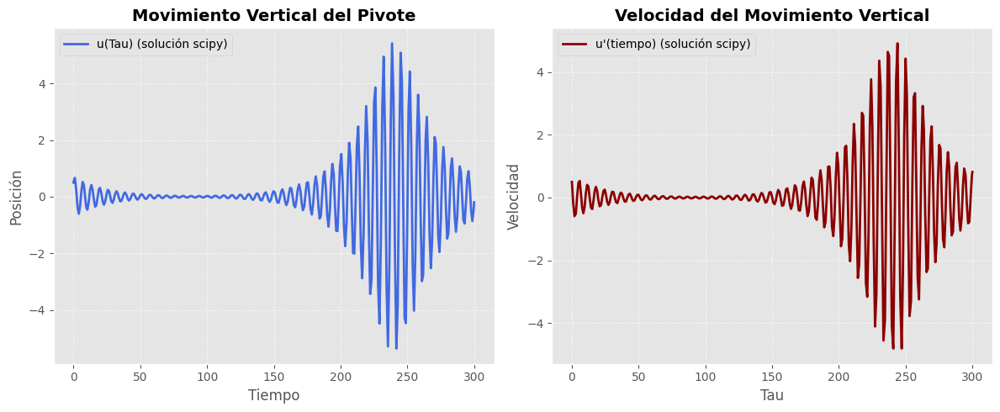

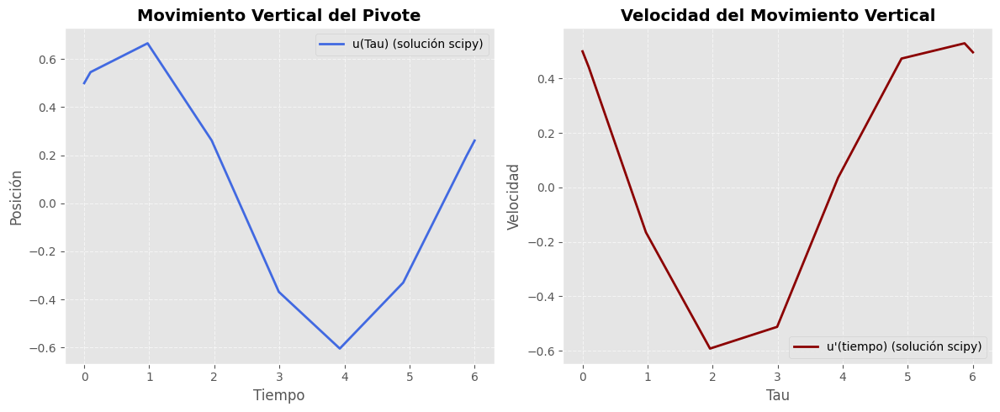

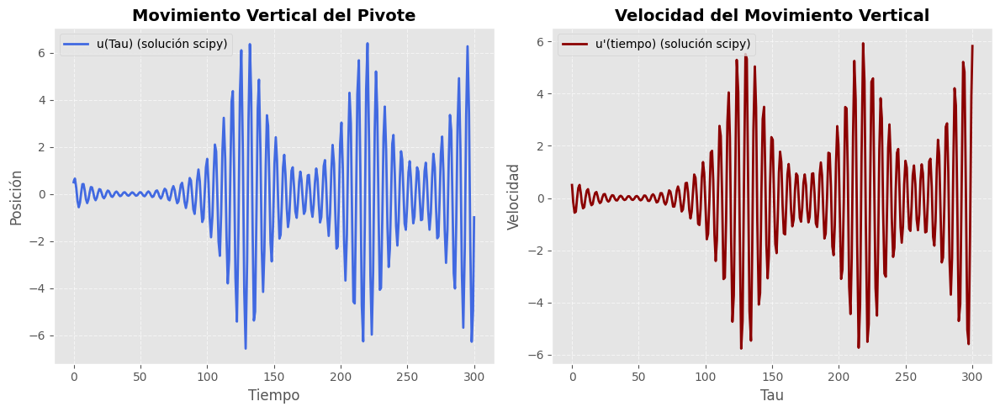

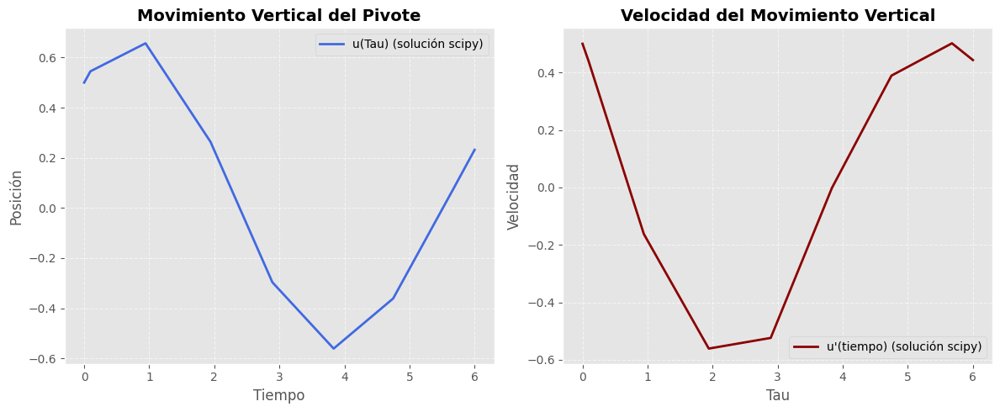

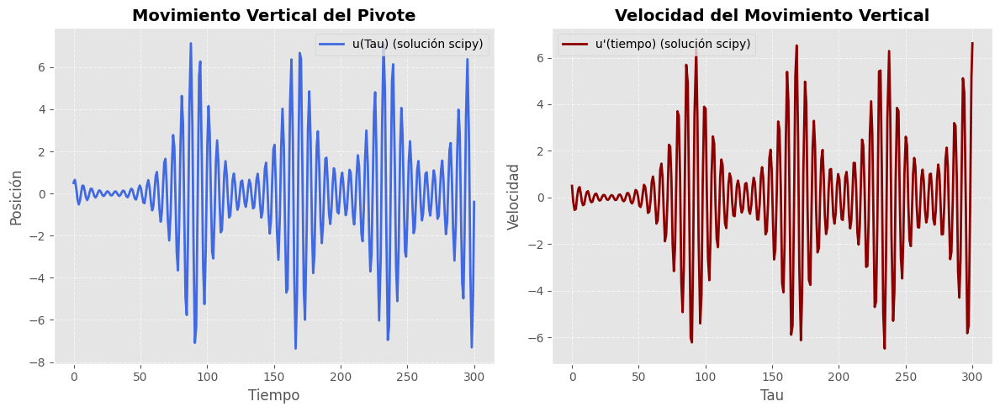

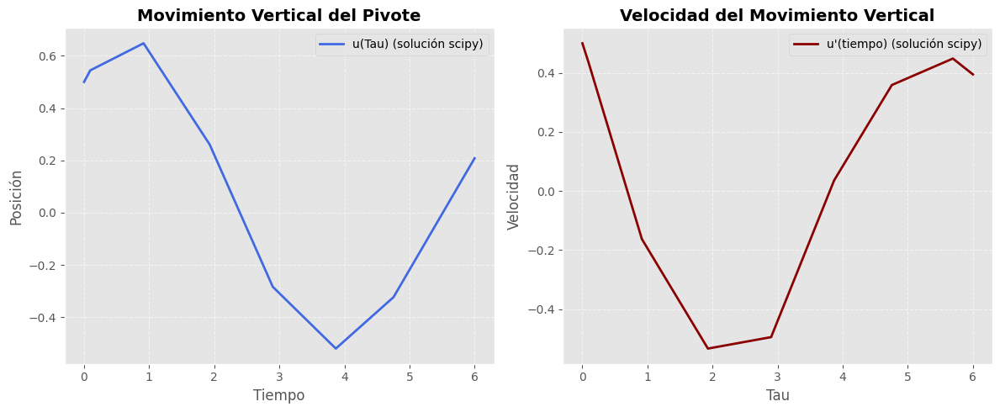

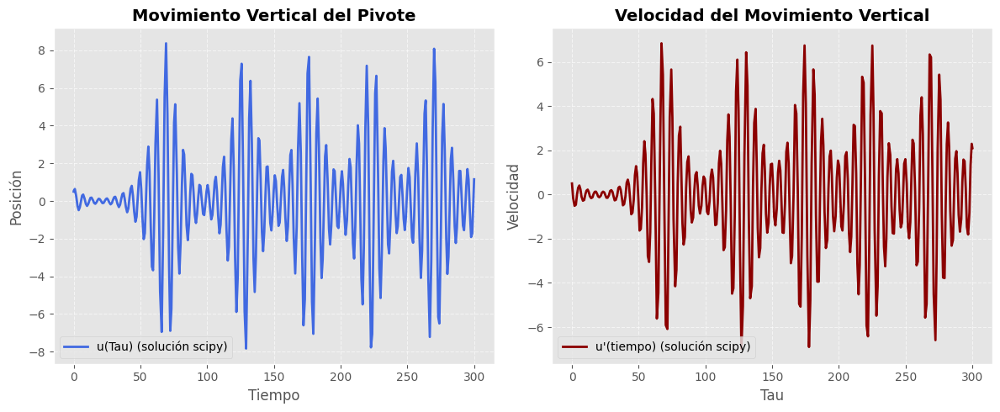

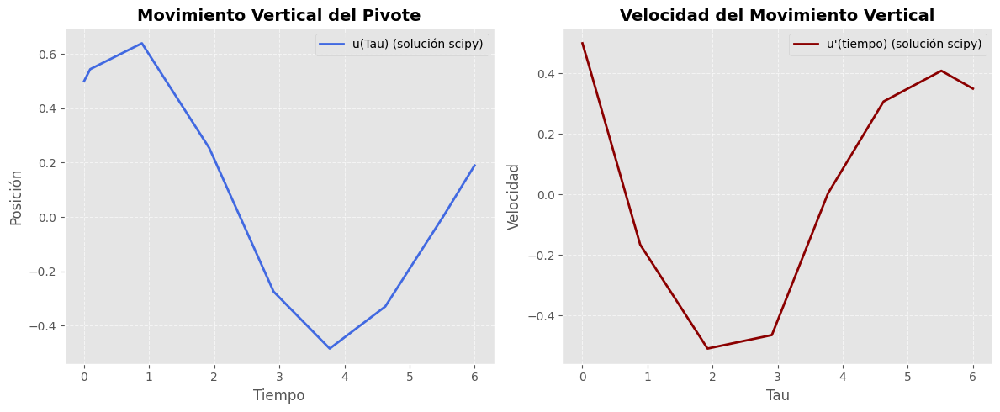

In [ ]:

for k in np.arange(0.1, 0.6, 0.1):
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 300, frecuencia[0], k, perturba[0]))
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 6, frecuencia[0], k, perturba[0]))

**Observaciones**

<div align="justify">

El parámetro
𝜆
λ desempeña un papel crucial en la estabilidad y dinámica del sistema, actuando como un factor amplificador de la excitación paramétrica no lineal en la ecuación diferencial.

Desde una perspectiva analítica, el término $ελΩ^2cos(Ωτ)$ introduce una modulación paramétrica en la frecuencia efectiva del sistema, lo que sugiere que valores crecientes de
𝜆
λ no solo amplifican la respuesta del sistema, sino que también pueden inducir inestabilidades paramétricas en ciertos regímenes. Estas inestabilidades pueden estar relacionadas con el efecto de Mathieu, donde pequeñas perturbaciones en la parametrización pueden llevar a crecimientos exponenciales en la amplitud de la oscilación.

Se observa experimentalmente que para $λ$=1, y cuando $τ$>35, el sistema exhibe errores de desbordamiento numérico, lo que sugiere una divergencia de la solución numérica debido al crecimiento no acotado de la amplitud de oscilación. Este fenómeno puede estar asociado con la aparición de soluciones explosivas debido a la interacción entre la excitación externa y las no linealidades del sistema.



</div>

**Experimentación conteo**

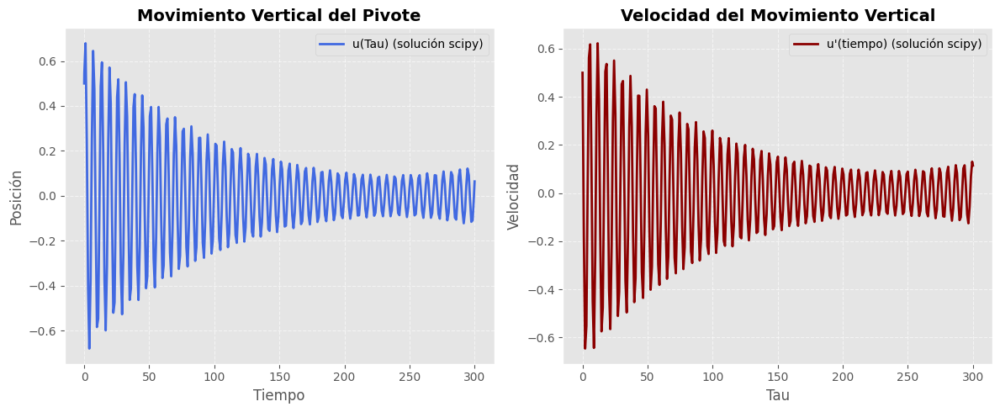

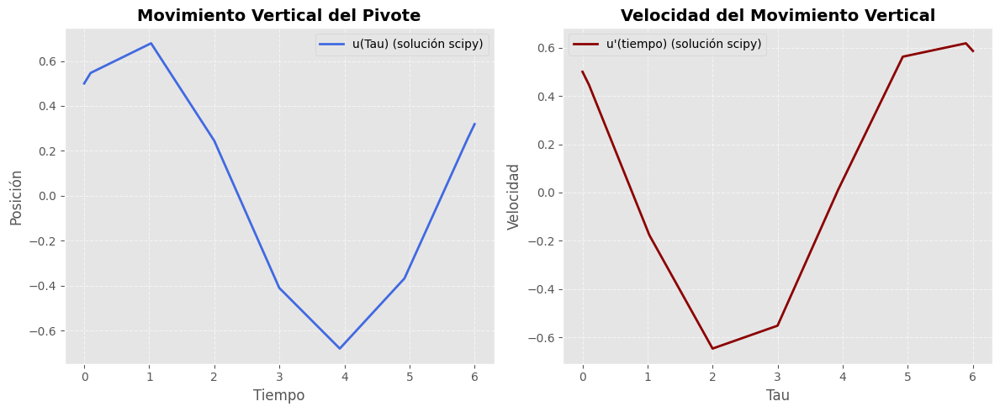

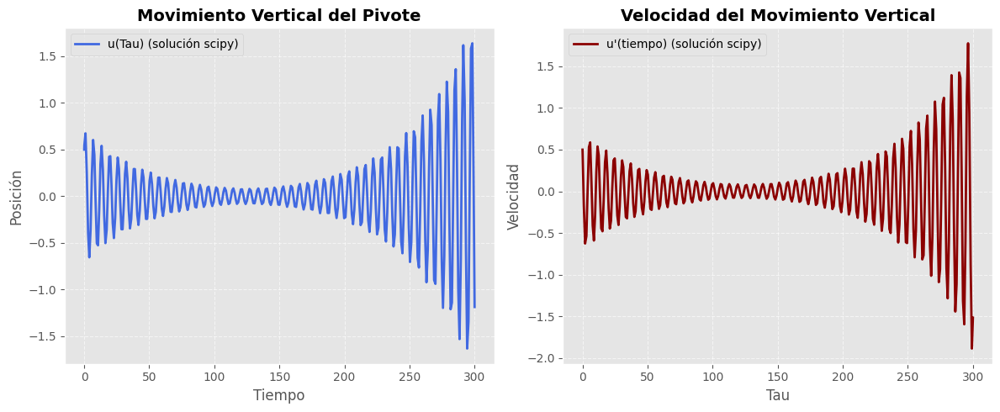

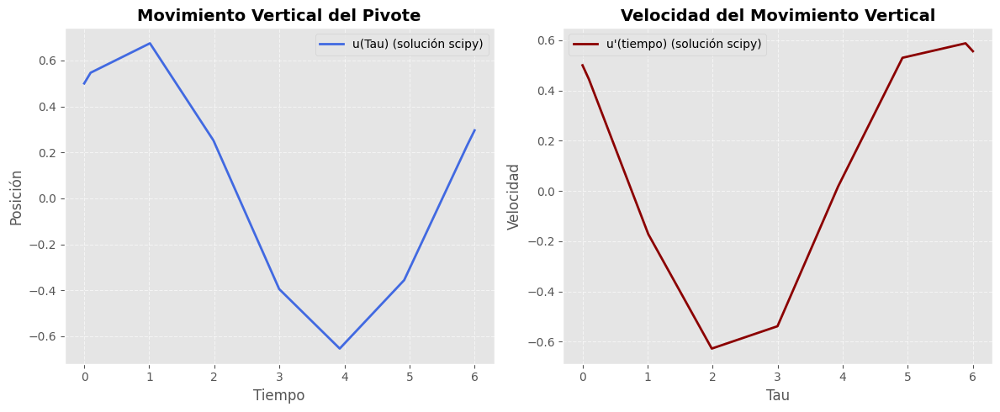

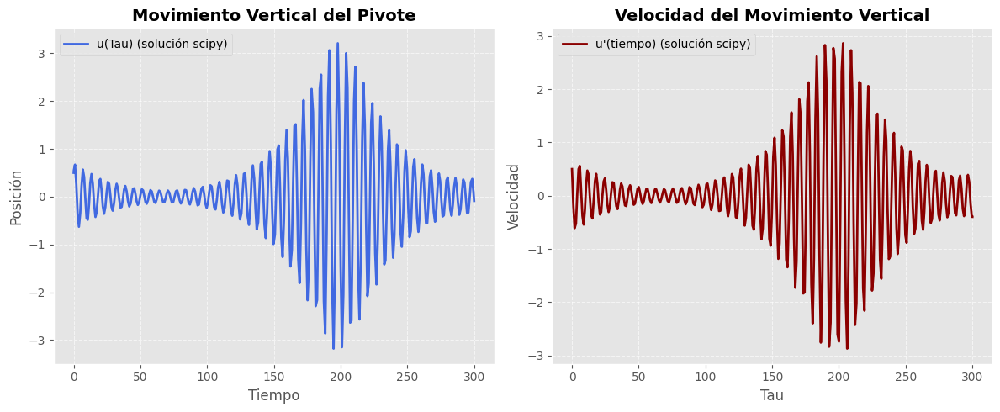

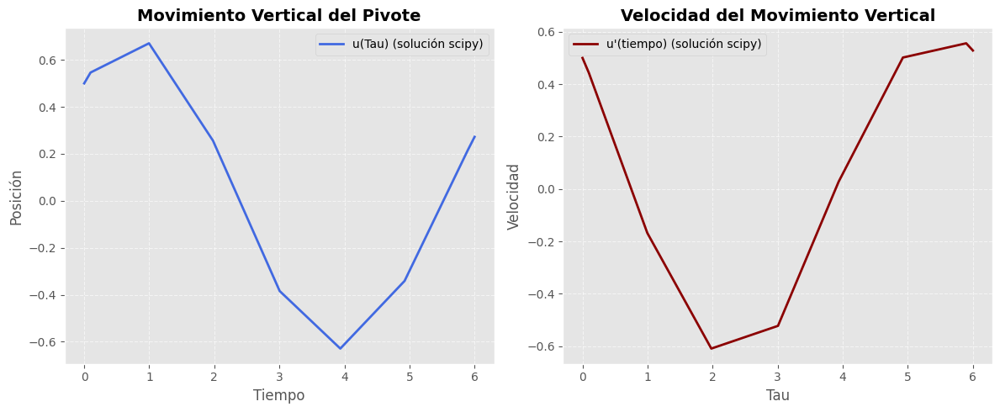

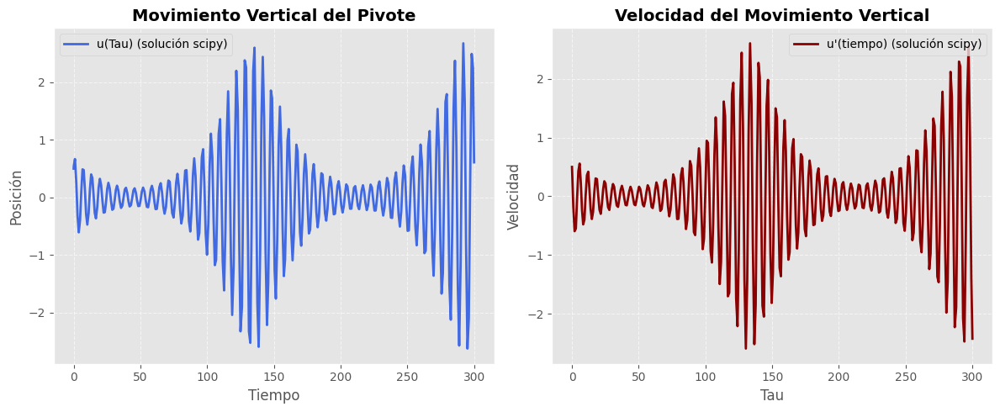

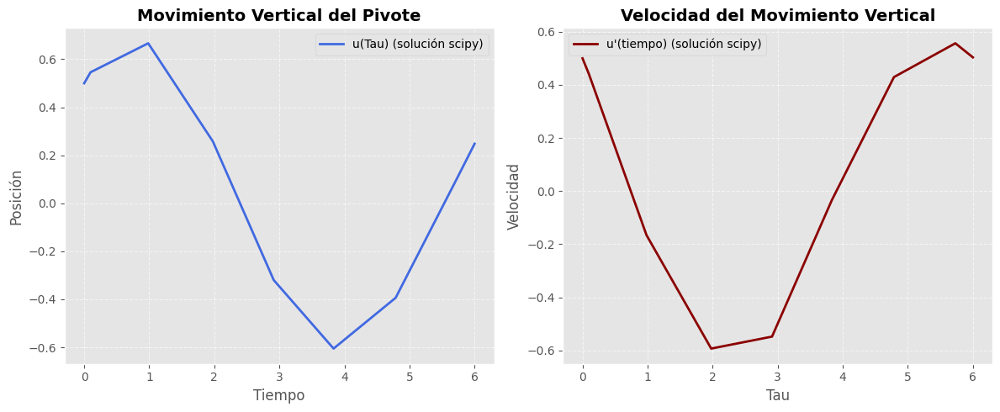

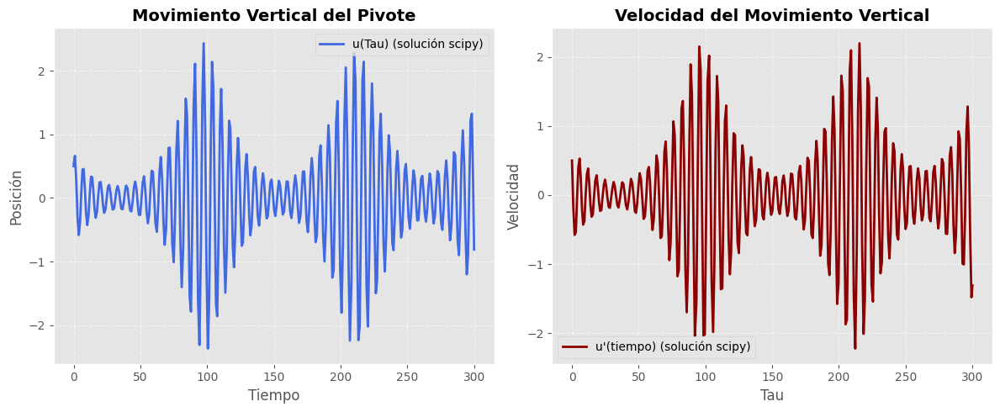

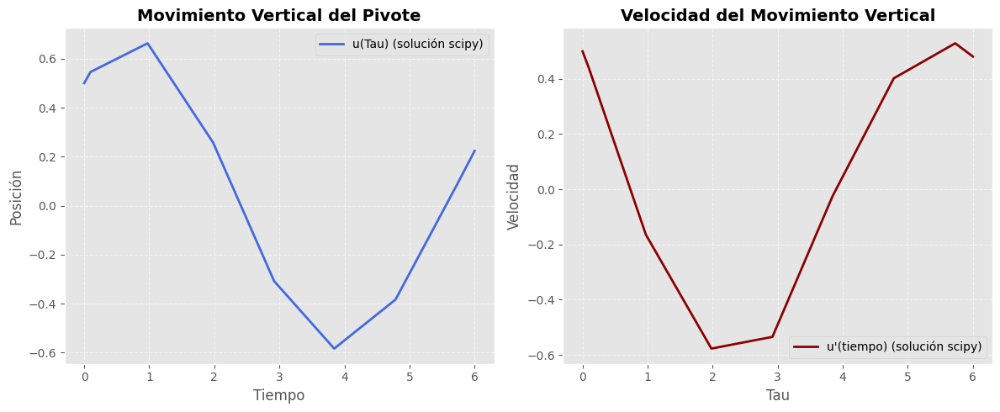

In [ ]:
for k in np.arange(0.1, 0.6, 0.1):
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 300, frecuencia[0], coef_lambda[0], k))
  Visualizar(*solucion(posicion_0[0], velocidad_0[0], tiempo_inicio[0], 6, frecuencia[0], coef_lambda[0], k))


**Observaciones**

<div align="justify">
El parámetro $ε$ en la ecuación diferencial, controla la intensidad de las no linealidades en el sistema. Su presencia en los términos $ελΩ^2cos(Ωτ)$ y
$𝜀^2*𝑢^3/6$ sugiere que un incremento en $𝜀$ amplifica tanto la excitación paramétrica como los efectos no lineales de la respuesta del sistema.

Desde una perspectiva analítica, el término $ελΩ2cos(Ωτ)$ introduce una modulación paramétrica dependiente de $ε$ en la frecuencia efectiva del sistema, lo que puede dar lugar a inestabilidades paramétricas tipo Mathieu cuando se alcanzan ciertos umbrales críticos. Además, la presencia del término cúbico $𝜀^2*𝑢^3/6$  sugiere que el sistema exhibe no linealidades de tipo Duffing, donde la respuesta del sistema puede alejarse significativamente del comportamiento armónico simple esperado en sistemas lineales.

Para valores pequeños de $ε$, la ecuación diferencial puede tratarse como una perturbación de un sistema oscilatorio lineal. Sin embargo, a medida que $ε$ aumenta, el acoplamiento entre la excitación paramétrica y la no linealidad cúbica se vuelve dominante, lo que puede generar fenómenos de bifurcación, amplificación de oscilaciones e incluso transiciones a dinámicas caóticas.

<div>